In [34]:
import os
import sys
import json
from pathlib import Path
sys.path.append(os.path.abspath('..'))

# ----------- local imports ----------- 
from utils import show_images, make_grid
from constants import TRAIN_PATH, BASE_DIR

In [4]:
import torch
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision import transforms
from diffusers import AutoencoderKL, FluxPipeline
from torchvision.transforms import functional as F


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = torch.Generator(device=device).manual_seed(42)
# dtype = torch.bfloat16
dtype = torch.float32

In [5]:
from diffusers.models.vae_flax import FlaxAutoencoderKL

# Load HQ Image

In [6]:
img_path = TRAIN_PATH / "WOMEN_Skirts_id_00007488_02_1_front.png"
img = Image.open(img_path)
img.size

(750, 1101)

In [7]:
class BottomCenterCrop:
    def __init__(self, size):
        self.size = size

    def __call__(self, img):
        w, h = img.size  # Original width and height
        new_h, new_w = self.size
        
        left = (w - new_w) // 2
        return F.crop(img, 0, left, new_h, new_w)

In [8]:
original_image = (1101, 750)
# make it smaller
# image_resize = (367, 250) # divided by 3 (H, W)
# image_crop = (360, 248) # H, W


image_resize = (1101, 750) # divided by 3 (H, W)
image_crop = (1096, 744) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img)
# show_images(img_clean)

# Try  VAE

In [17]:
vae_cfg = {
  "_class_name": "AutoencoderKL",
  "_diffusers_version": "0.30.0.dev0",
  "_name_or_path": "../checkpoints/flux-dev",
  "act_fn": "silu",
  "block_out_channels": [
    128,
    256,
    512,
    512
  ],
  "down_block_types": [
    "DownEncoderBlock2D",
    "DownEncoderBlock2D",
    "DownEncoderBlock2D",
    "DownEncoderBlock2D"
  ],
  "force_upcast": True,
  "in_channels": 3,
  "latent_channels": 16,
  "latents_mean": None,
  "latents_std": None,
  "layers_per_block": 2,
  "mid_block_add_attention": True,
  "norm_num_groups": 32,
  "out_channels": 3,
  "sample_size": 1024,
  "scaling_factor": 0.3611,
  "shift_factor": 0.1159,
  "up_block_types": [
    "UpDecoderBlock2D",
    "UpDecoderBlock2D",
    "UpDecoderBlock2D",
    "UpDecoderBlock2D"
  ],
  "use_post_quant_conv": False,
  "use_quant_conv": False
}


In [21]:
from diffusers.models import AutoencoderKL

In [22]:
vae_link = "https://huggingface.co/stabilityai/sd-vae-ft-mse-original/vae-ft-mse-840000-ema-pruned.ckpt"
vae_link_flux = "https://huggingface.co/black-forest-labs/FLUX.1-dev/vae/diffusion_pytorch_model.safetensors"

vae_mse = AutoencoderKL().from_single_file(vae_link, torch_dtype=dtype).to(device)
vae_sd_15 = AutoencoderKL().from_pretrained("SG161222/Realistic_Vision_V6.0_B1_noVAE", subfolder="vae", torch_dtype=dtype).to(device)
vae_sd_2 = AutoencoderKL().from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="vae", torch_dtype=dtype).to(device)
vae_flux = AutoencoderKL(**vae_cfg).from_single_file(vae_link, torch_dtype=dtype).to(device)
#.from_single_file(vae_link_flux, torch_dtype=dtype).to(device)

An error occurred while trying to fetch SG161222/Realistic_Vision_V6.0_B1_noVAE: SG161222/Realistic_Vision_V6.0_B1_noVAE does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [23]:
# def encode_image(img_clean, vae):
def encode_vae(img_clean, vae):
    img_clean = img_clean.unsqueeze(0).to(device)
    with torch.no_grad():
        img_latents = vae.encode(img_clean).latent_dist.sample() * vae.config.scaling_factor
    return img_latents

def decode_vae(img_latents, vae):
    outputs = img_latents / vae.config.scaling_factor
    with torch.no_grad():
        outputs  = vae.decode(outputs).sample
    return outputs

In [24]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)
x_flux = decode_vae(encode_vae(img_clean, vae_flux), vae_flux)

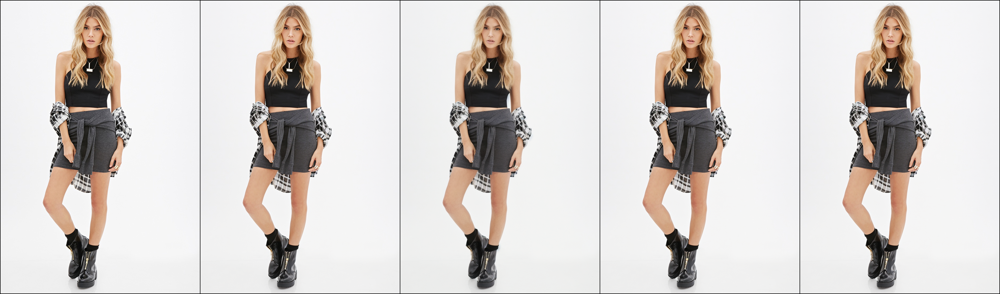

In [25]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2, x_flux])

show_images(show)

**MSE wining**

# Try VAE on LQ image

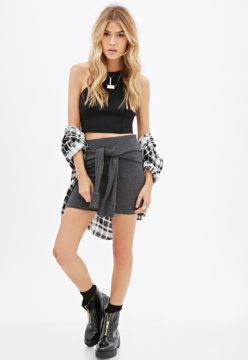

In [26]:
original_image = (1101, 750)
# make it smaller
image_resize = (367, 250) # divided by 3 (H, W)
image_crop = (360, 248) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img)
show_images(img_clean)

In [27]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)
x_flux = decode_vae(encode_vae(img_clean, vae_flux), vae_flux)

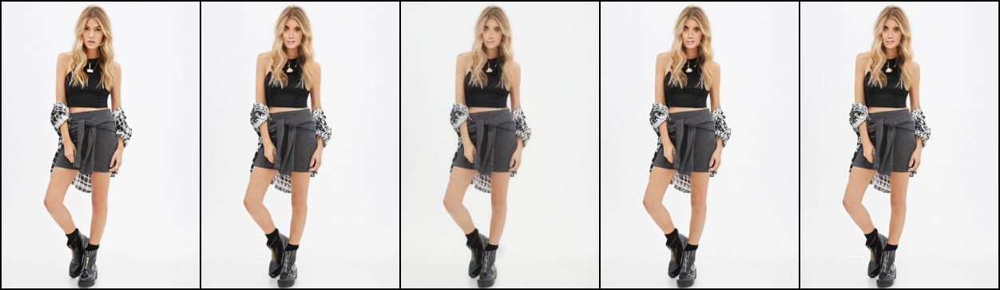

In [29]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2, x_flux])

show_images(show)

# Try VAE on bFloat16

In [18]:
dtype = torch.bfloat16
# go to float
vae_mse.type(dtype)
vae_sd_15.type(dtype)
vae_sd_2.type(dtype)

image_resize = (1101, 750) # divided by 3 (H, W)
image_crop = (1096, 744) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img).type(dtype).to(device)

In [19]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)

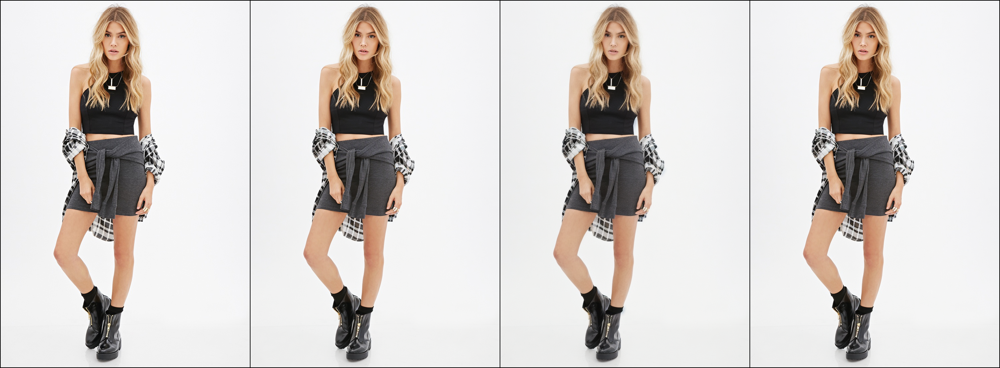

In [20]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2]).type(torch.float32)

show_images(show)